In [ ]:

# Replacement for scipy.misc (deprecated)
# Use PIL and imageio instead
from PIL import Image
import imageio

# Example: Read and resize image
img = imageio.imread('data/sample_image.jpg')
img = Image.fromarray(img).resize((256, 256))


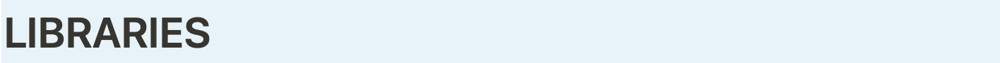

In [14]:
import os 
import re 
from scipy import ndimage, misc 
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array


from skimage.transform import resize, rescale
import matplotlib.pyplot as plt
import numpy as np
np. random. seed(0)
import cv2 as cv2

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense ,Conv2D,MaxPooling2D ,Dropout, Activation
from tensorflow.keras.layers import Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
import tensorflow as tf

print(tf.__version__)

2.6.0


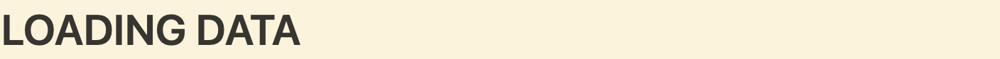

In [15]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = '../input/image-super-resolution/dataset/Raw Data/high_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '855.png':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '../input/image-super-resolution/dataset/Raw Data/low_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '855.png':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))

100%|██████████| 855/855 [00:03<00:00, 238.96it/s]


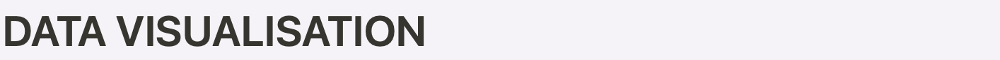

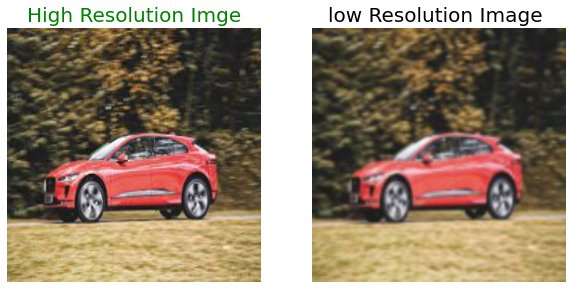

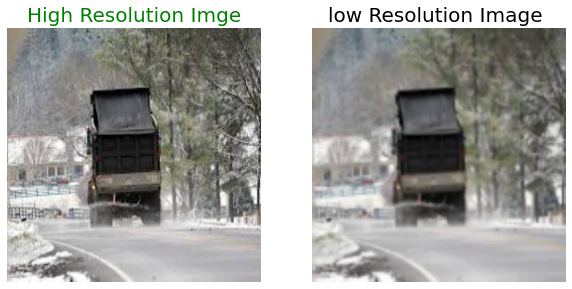

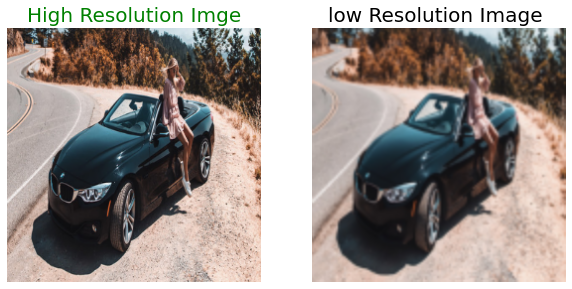

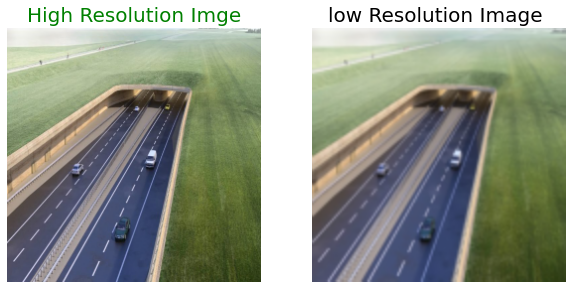

In [16]:
for i in range(4):
    a = np.random.randint(0,855)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')

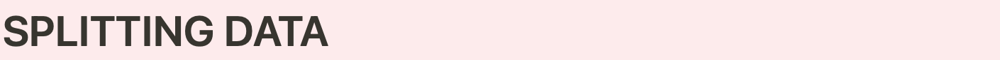

In [17]:
train_high_image = high_img[:700]
train_low_image = low_img[:700]
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[700:810]
validation_low_image = low_img[700:810]
validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[810:]
test_low_image = low_img[810:]
test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)

Shape of training images: (700, 256, 256, 3)
Shape of test images: (45, 256, 256, 3)
Shape of validation images: (110, 256, 256, 3)


# ARCITECTURE OF MODEL 


Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 256, 256, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_18 (BatchNo (None, 256, 256, 64) 256         conv2d_19[0][0]                  
__________________________________________________________________________________________________
activation_18 (Activation)      (None, 256, 256, 64) 0           batch_normalization_18[0][0]     
______________________________________________________________________________________________

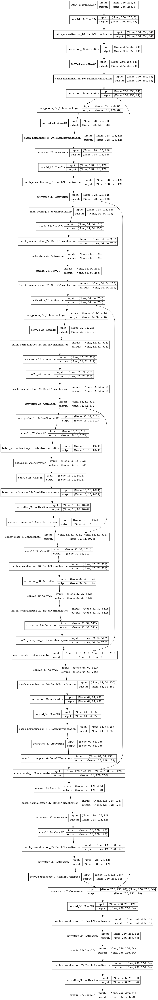

In [18]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Activation, MaxPool2D, Concatenate




def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)    
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)  
    x = Activation("relu")(x)

    return x

#Encoder block: Conv block followed by maxpooling
def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p   

#Decoder block
#skip features gets input from encoder for concatenation

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

#Build Unet using the blocks
def build_unet(input_shape):
    inputs = Input(shape=(256,256,3))
    
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)             #Bridge

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(3, 1, padding="same", activation="LeakyReLU")(d4)  #Binary (can be multiclass)

    model = Model(inputs, outputs, name="U-Net")
    
    model.summary()
    return model
inputs = Input(shape=(256,256,3))
model = build_unet(inputs) 
plot_model(model, to_file ='super_res(U-NET).png',show_shapes=True)

In [19]:
def pixel_mse_loss(x,y):
    return tf.reduce_mean( (x - y) ** 2 )

Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 256, 256, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_18 (BatchNo (None, 256, 256, 64) 256         conv2d_19[0][0]                  
__________________________________________________________________________________________________
activation_18 (Activation)      (None, 256, 256, 64) 0           batch_normalization_18[0][0]     
______________________________________________________________________________________________

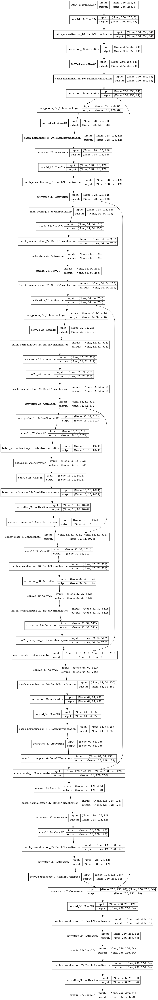

In [20]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = pixel_mse_loss,
              metrics = ['acc'])
model.summary()
plot_model(model, to_file ='super_res(U-NET).png',show_shapes=True)

In [21]:
model.fit(train_low_image, train_high_image, epochs = 10, batch_size = 1,
          validation_data = (validation_low_image,validation_high_image))

Epoch 1/10
700/700 [==============================] - 39s 54ms/step - loss: 0.0319 - acc: 0.4868 - val_loss: 0.0156 - val_acc: 0.6136
Epoch 2/10
700/700 [==============================] - 37s 53ms/step - loss: 0.0204 - acc: 0.5128 - val_loss: 0.0986 - val_acc: 0.6264
Epoch 3/10
700/700 [==============================] - 36s 51ms/step - loss: 0.0176 - acc: 0.5260 - val_loss: 0.0506 - val_acc: 0.5543
Epoch 4/10
700/700 [==============================] - 37s 53ms/step - loss: 0.0162 - acc: 0.5353 - val_loss: 0.0074 - val_acc: 0.6193
Epoch 5/10
700/700 [==============================] - 36s 51ms/step - loss: 0.0148 - acc: 0.5479 - val_loss: 0.0220 - val_acc: 0.5889
Epoch 6/10
700/700 [==============================] - 37s 53ms/step - loss: 0.0139 - acc: 0.5518 - val_loss: 0.0107 - val_acc: 0.6428
Epoch 7/10
700/700 [==============================] - 36s 51ms/step - loss: 0.0126 - acc: 0.5647 - val_loss: 0.0061 - val_acc: 0.5908
Epoch 8/10
700/700 [==============================] - 37s 53ms

In [22]:
model.save('superresolution_unet.h5')

In [23]:
def PSNR(y_true,y_pred):
    mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
    return 20 * log10(1/ (mse ** 0.5))

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def pixel_MSE(y_true,y_pred):
    return tf.reduce_mean( (y_true - y_pred) ** 2 )

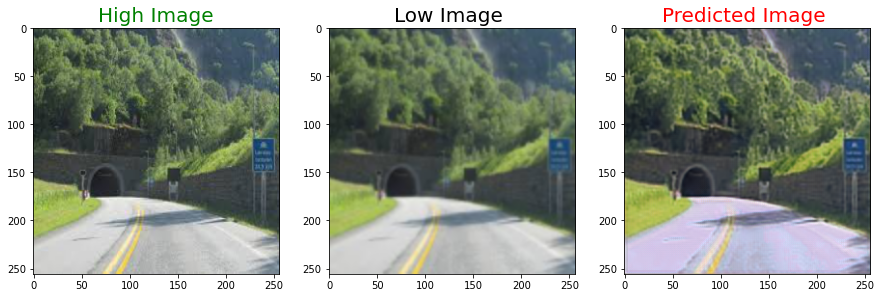

PSNR tf.Tensor(27.082006, shape=(), dtype=float32) dB


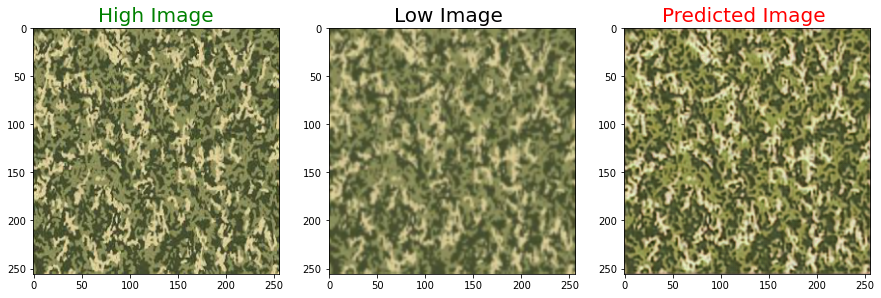

PSNR tf.Tensor(24.953337, shape=(), dtype=float32) dB


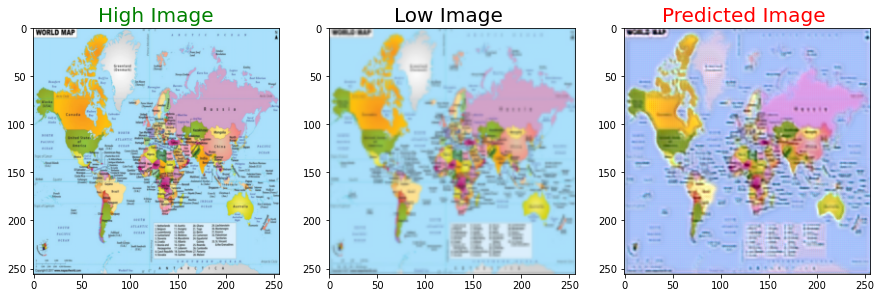

PSNR tf.Tensor(21.093046, shape=(), dtype=float32) dB


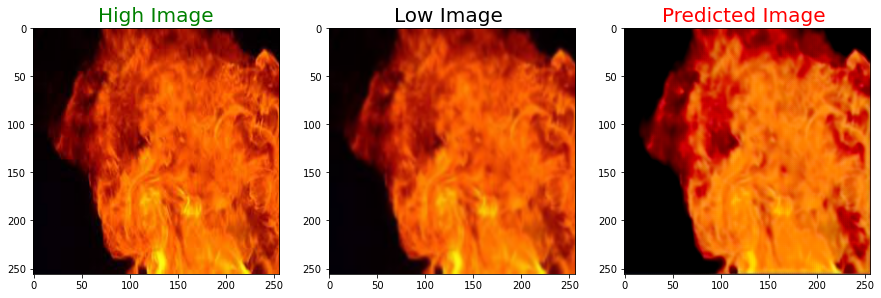

PSNR tf.Tensor(25.27927, shape=(), dtype=float32) dB


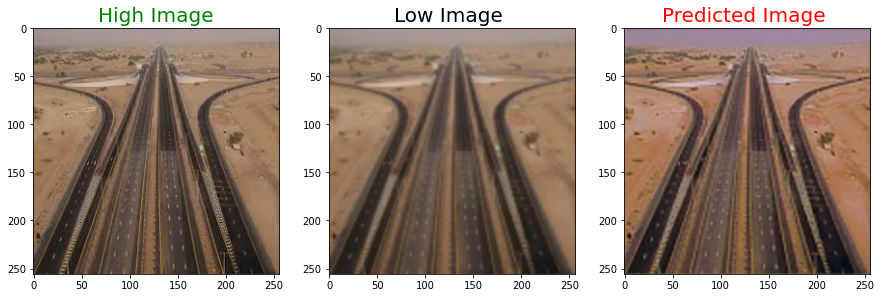

PSNR tf.Tensor(27.507233, shape=(), dtype=float32) dB


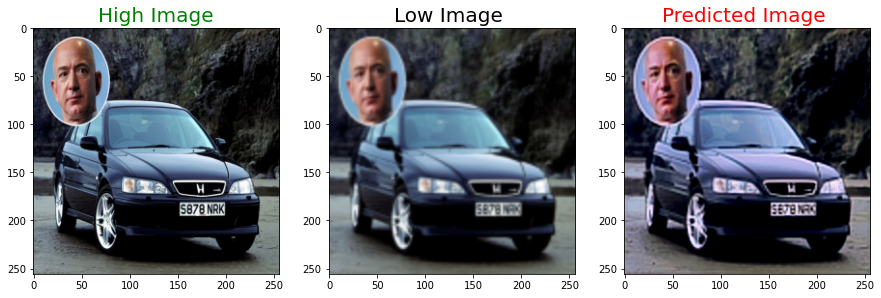

PSNR tf.Tensor(24.55133, shape=(), dtype=float32) dB


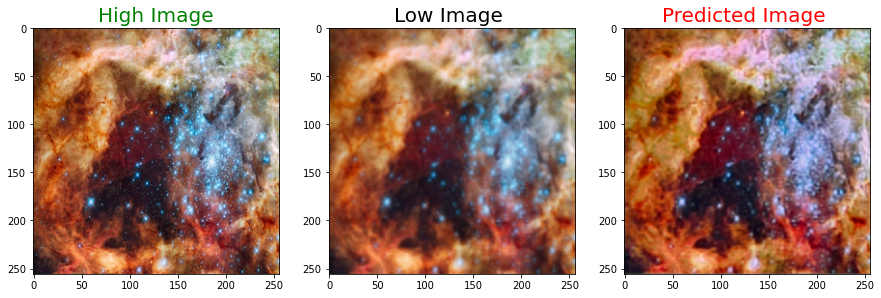

PSNR tf.Tensor(24.958399, shape=(), dtype=float32) dB


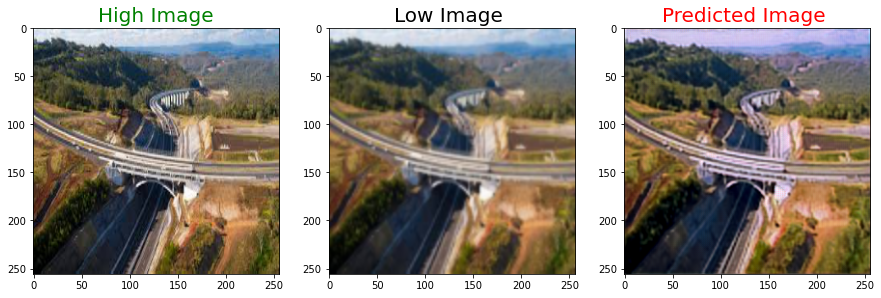

PSNR tf.Tensor(26.177574, shape=(), dtype=float32) dB


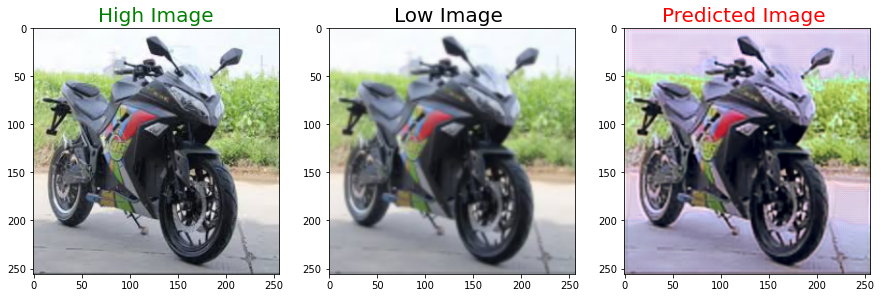

PSNR tf.Tensor(23.364155, shape=(), dtype=float32) dB


In [24]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(16,25):
    
    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)
    print('PSNR',PSNR(test_high_image[i],predicted),'dB')

In [25]:
def downsample_image(image,scale):
    x=tf.image.resize(image / 255,(image.shape[0]//scale, image.shape[1]//scale))
    x=tf.image.resize(x,(image.shape[0], image.shape[1]), method = tf.image.ResizeMethod.BICUBIC)
    return x

100%|██████████| 100/100 [00:00<00:00, 160.71it/s]


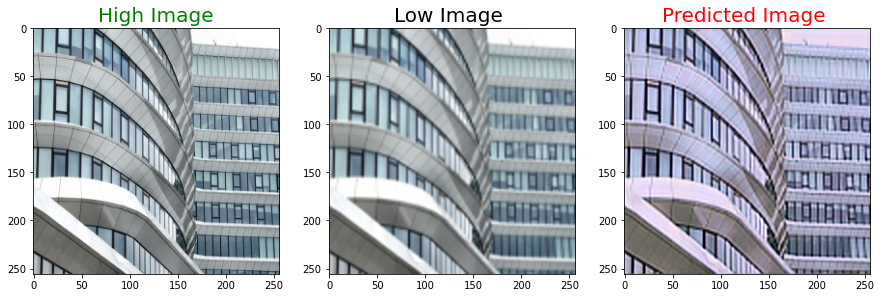

PSNR tf.Tensor(20.761639, shape=(), dtype=float32) dB SSIM tf.Tensor(0.76764303, shape=(), dtype=float32)


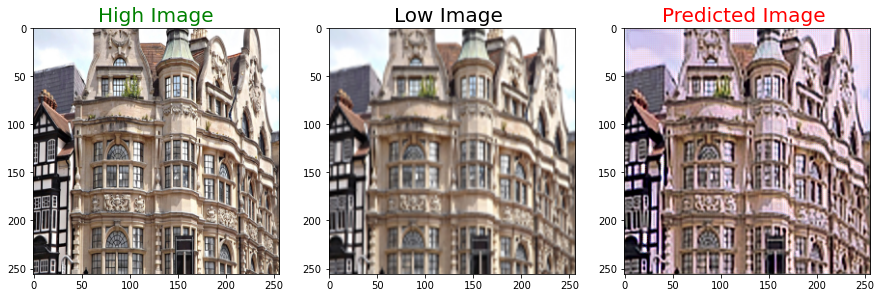

PSNR tf.Tensor(19.448008, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7752635, shape=(), dtype=float32)


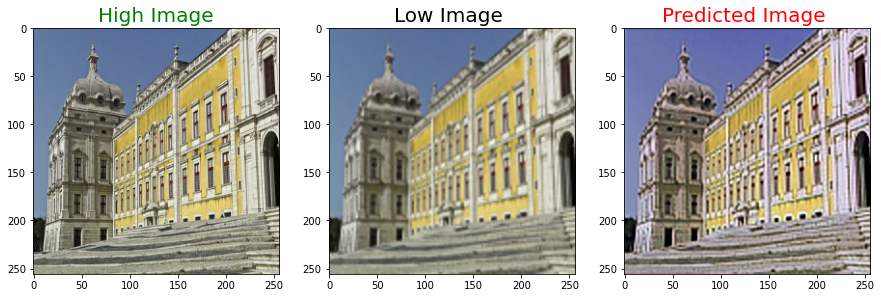

PSNR tf.Tensor(20.98383, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7670341, shape=(), dtype=float32)


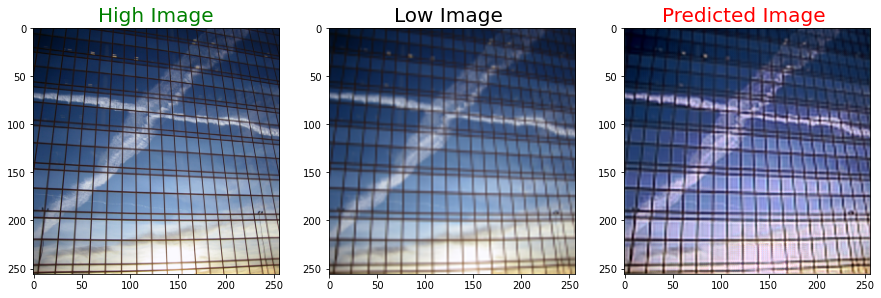

PSNR tf.Tensor(21.104506, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7035833, shape=(), dtype=float32)


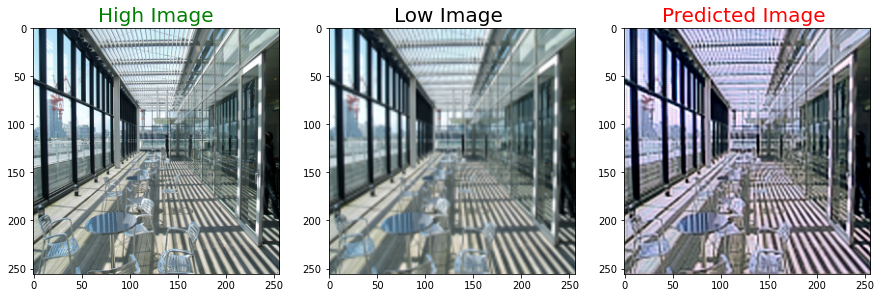

PSNR tf.Tensor(20.600876, shape=(), dtype=float32) dB SSIM tf.Tensor(0.76603216, shape=(), dtype=float32)


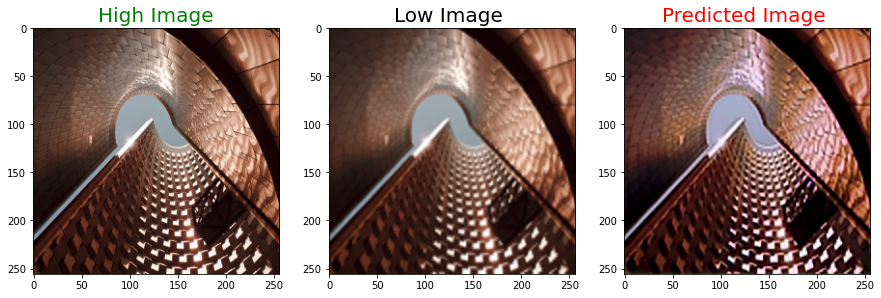

PSNR tf.Tensor(23.517487, shape=(), dtype=float32) dB SSIM tf.Tensor(0.78583145, shape=(), dtype=float32)


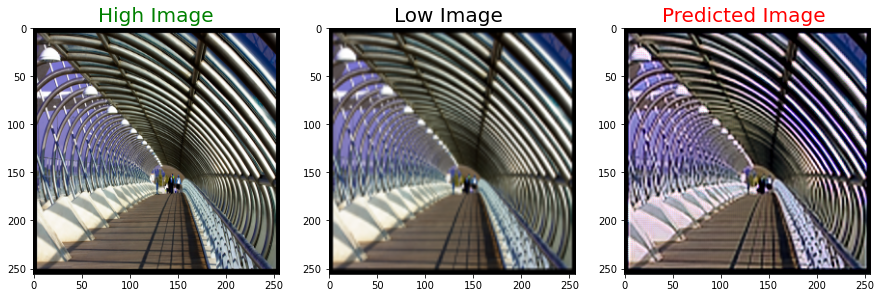

PSNR tf.Tensor(19.625803, shape=(), dtype=float32) dB SSIM tf.Tensor(0.7752742, shape=(), dtype=float32)


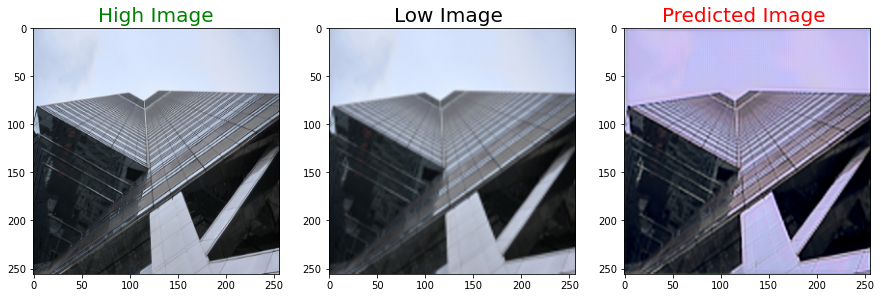

PSNR tf.Tensor(22.575897, shape=(), dtype=float32) dB SSIM tf.Tensor(0.73387676, shape=(), dtype=float32)


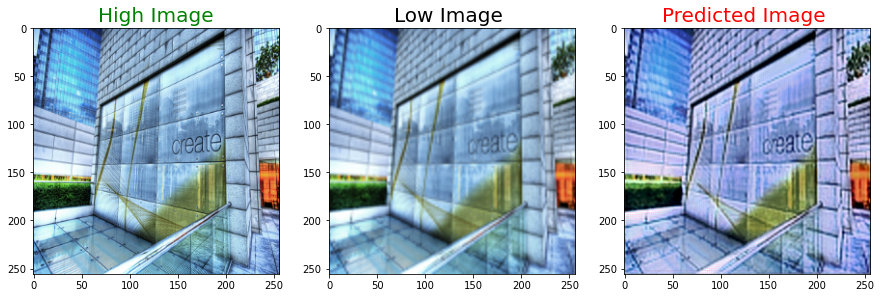

PSNR tf.Tensor(21.23236, shape=(), dtype=float32) dB SSIM tf.Tensor(0.729484, shape=(), dtype=float32)


In [26]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
#SIZE = 512
high_img = []
path = '../input/urban100/Urban 100/X2 Urban100/X2/HIGH X2 Urban'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '100.png':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '../input/urban100/Urban 100/X2 Urban100/X2/LOW X2 Urban'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '100.png':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #img = downsample_image(img,4)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        #img = img.astype('float32') / 255.0
        img = downsample_image(img,2)
        low_img.append(img_to_array(img))
        
high_image = high_img[:50]
low_image = low_img[:50]
high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

#validation_high_image = high_img[650:750]
#validation_low_image = low_img[650:750]
#validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE*2,SIZE*2,3))
#validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


t_high_image = high_img[50:]
t_low_image = low_img[50:]
t_high_image= np.reshape(t_high_image,(len(t_high_image),SIZE,SIZE,3))
t_low_image = np.reshape(t_low_image,(len(t_low_image),SIZE,SIZE,3))


def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(1,10):
    
    predicted = np.clip(model.predict(t_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(t_high_image[i],t_low_image[i],predicted)
    print('PSNR',PSNR(t_high_image[i],predicted),'dB',"SSIM",tf.image.ssim(t_high_image[i],predicted,max_val=1))